### FETCHING SATELLITE IMAGES
In the initial part, COPERNICUS/S2_SR_HARMONIZED dataset is used from Google Earth Engine to fetch satellite images. The dates are selected by filtering the least cloudy day in June for each year from 2018 to 2023.

Fetching images...
Found image for June 2018 from date: 2018-06-29 (Cloud cover: 11.0%)
Found image for June 2019 from date: 2019-06-29 (Cloud cover: 0.2%)
Found image for June 2020 from date: 2020-06-23 (Cloud cover: 2.1%)
Found image for June 2021 from date: 2021-06-18 (Cloud cover: 0.2%)
Found image for June 2022 from date: 2022-06-23 (Cloud cover: 0.0%)
Found image for June 2023 from date: 2023-06-08 (Cloud cover: 0.0%)
Converting 2018 image...
2018 image saved as satellite_images/sentinel_2018.png
Converting 2019 image...
2019 image saved as satellite_images/sentinel_2019.png
Converting 2020 image...
2020 image saved as satellite_images/sentinel_2020.png
Converting 2021 image...
2021 image saved as satellite_images/sentinel_2021.png
Converting 2022 image...
2022 image saved as satellite_images/sentinel_2022.png
Converting 2023 image...
2023 image saved as satellite_images/sentinel_2023.png
Full comparison image saved as satellite_images/sentinel_comparison_all.png


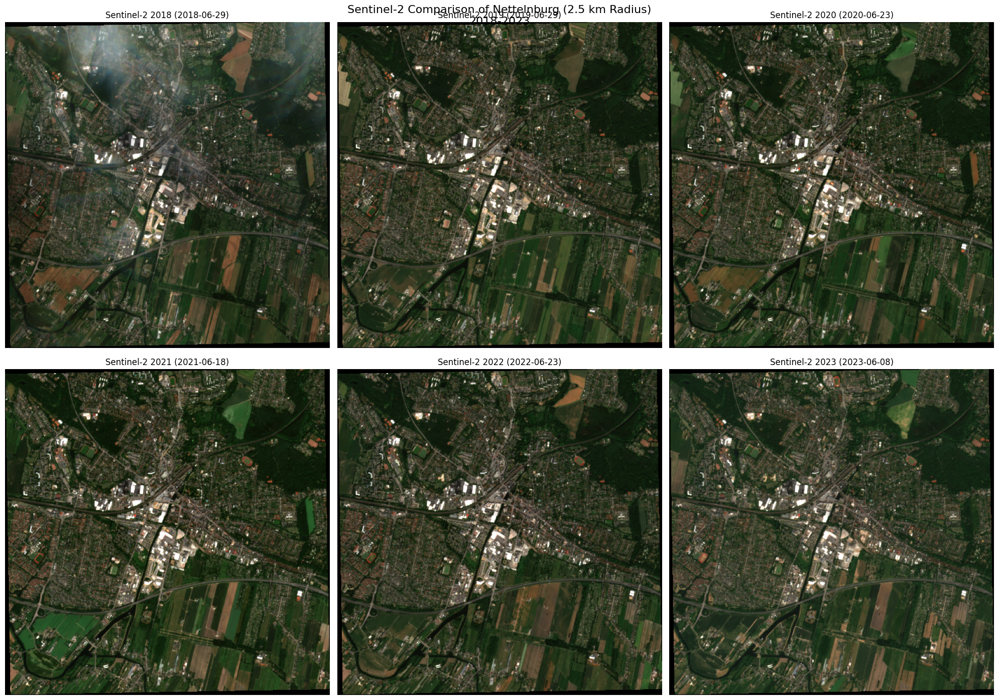

In [ ]:
import ee
import geemap
import datetime
import os

# Create output directory
output_dir = "satellite_images"
os.makedirs(output_dir, exist_ok=True)

# Initialize GEE with project ID
try:
    ee.Initialize(project='agile-coral-456206-c4')
except Exception:
    ee.Authenticate()
    ee.Initialize(project='agile-coral-456206-c4')

# Define the center point and region (5km x 5km square)
lon, lat = 10.20724, 53.48401
point = ee.Geometry.Point([lon, lat])
region = point.buffer(2500).bounds()  # 2500 meters = 2.5 km radius

# Function to get the least cloudy image from a given year
def get_sentinel_image(year):
    """Get least cloudy Sentinel-2 image from May of given year"""
    # Set date range for May
    start_date = f'{year}-06-01'
    end_date = f'{year}-06-30'

    collection = (
        ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
        .filterBounds(region)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 30))
    )

    # Get image count
    count = collection.size().getInfo()

    if count == 0:
        print(f"No images found for May {year} with cloud cover < 30%, trying with higher threshold...")
        collection = (
            ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
            .filterBounds(region)
            .filterDate(start_date, end_date)
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50))
        )
        count = collection.size().getInfo()

    if count == 0:
        print(f"No images found for May {year}")
        return None

    # Get the least cloudy image
    image = collection.sort('CLOUDY_PIXEL_PERCENTAGE').first()
    date = image.date().format('YYYY-MM-dd').getInfo()
    cloud_cover = image.get('CLOUDY_PIXEL_PERCENTAGE').getInfo()
    print(f"Found image for June {year} from date: {date} (Cloud cover: {cloud_cover:.1f}%)")

    return image.clip(region)

# Define years to process
years = [2018, 2019, 2020, 2021, 2022, 2023]

# Dictionary to store images
images = {}
rgb_images = {}

# Try to get images for all years
print("Fetching images...")
for year in years:
    images[year] = get_sentinel_image(year)

# Check if we have all images
if any(images[year] is None for year in years):
    print("Could not find valid images for all years")
else:
    import matplotlib.pyplot as plt
    import numpy as np

    # Function to get RGB numpy array from image
    def get_rgb(image):
        rgb = geemap.ee_to_numpy(
            image.select(['B4', 'B3', 'B2']).divide(3000).clamp(0, 1).multiply(255),
            region=region,
            scale=10
        )
        return rgb.astype(np.uint8)

    # Get RGB data for all years
    for year in years:
        print(f"Converting {year} image...")
        rgb_images[year] = get_rgb(images[year])

        # Save individual image with relative path
        plt.figure(figsize=(12, 12))
        plt.imshow(rgb_images[year])
        date = images[year].date().format('YYYY-MM-dd').getInfo()
        plt.title(f"Sentinel-2 {year} ({date})", fontsize=14)
        plt.axis('off')
        output_path = os.path.join(output_dir, f'sentinel_{year}.png')
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        print(f"{year} image saved as {output_path}")
        plt.close()

    # Create and save comparison figure
    plt.figure(figsize=(20, 15))

    for i, year in enumerate(years, 1):
        plt.subplot(2, 3, i)
        plt.imshow(rgb_images[year])
        date = images[year].date().format('YYYY-MM-dd').getInfo()
        plt.title(f"Sentinel-2 {year} ({date})", fontsize=12)
        plt.axis('off')

    plt.suptitle("Sentinel-2 Comparison of Nettelnburg (2.5 km Radius)\n2018-2023",
                 fontsize=16, y=0.95)
    plt.tight_layout()
    comparison_path = os.path.join(output_dir, 'sentinel_comparison_all.png')
    plt.savefig(comparison_path, dpi=300, bbox_inches='tight')
    print(f"Full comparison image saved as {comparison_path}")
    plt.show()


### IMAGE SEGMENTATION
In this part, a range for green color is specified to segment green areas in the image. Then, the green area percentages are calculated for each year and compared. The green area changes between 2018-2023 is shown in a graphic chart.



Processing image for year 2018...
Segmented image saved to green_analysis/green_areas_2018.png
Green area percentage: 27.06%
Green area: 169.11 hectares

Processing image for year 2019...
Segmented image saved to green_analysis/green_areas_2019.png
Green area percentage: 26.64%
Green area: 166.52 hectares

Processing image for year 2020...
Segmented image saved to green_analysis/green_areas_2020.png
Green area percentage: 28.98%
Green area: 181.16 hectares

Processing image for year 2021...
Segmented image saved to green_analysis/green_areas_2021.png
Green area percentage: 26.77%
Green area: 167.30 hectares

Processing image for year 2022...
Segmented image saved to green_analysis/green_areas_2022.png
Green area percentage: 23.25%
Green area: 145.29 hectares

Processing image for year 2023...
Segmented image saved to green_analysis/green_areas_2023.png
Green area percentage: 34.94%
Green area: 218.39 hectares

Segmentation comparison saved to green_analysis/segmentation_comparison.png

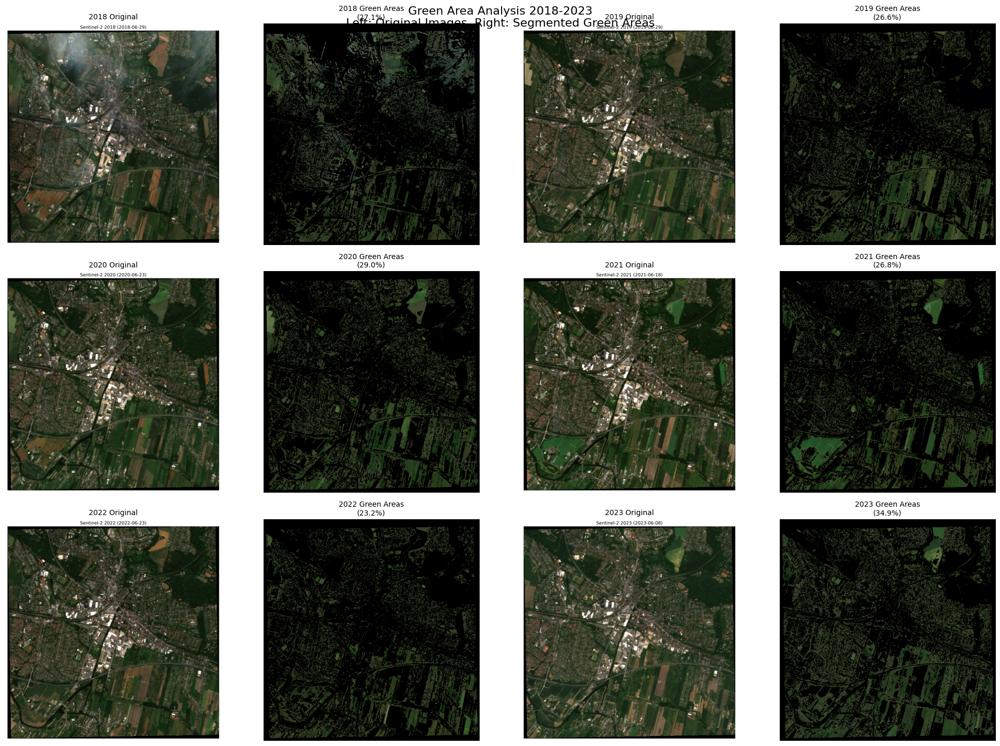

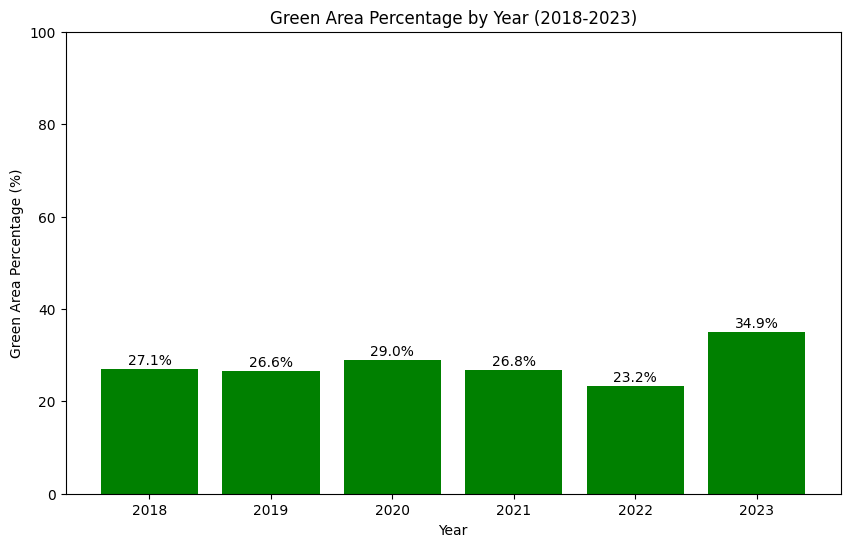

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import datetime
import json

TOTAL_AREA_HECTARES = 625  # 2.5km x 2.5km = 6.25 km² = 625 hectares

def calculate_green_percentage(mask):
    """Calculate the percentage of green areas in the image."""
    total_pixels = mask.size
    green_pixels = np.count_nonzero(mask)
    return (green_pixels / total_pixels) * 100

def segment_green_areas(image_path, output_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image {image_path}")

    # Convert to HSV color space (better for color segmentation)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range for green color in HSV
    lower_green = np.array([35, 50, 50])
    upper_green = np.array([85, 255, 255])

    # Create mask for green areas
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Apply some morphological operations to clean up the mask
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)  # Remove noise
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)  # Close small holes

    # Calculate green percentage
    green_percentage = calculate_green_percentage(mask)

    # Create a colored output where green areas are highlighted
    result = img.copy()
    result[mask == 0] = [0, 0, 0]  # Set non-green areas to black

    # Save the result
    cv2.imwrite(output_path, result)
    print(f"Segmented image saved to {output_path}")
    print(f"Green area percentage: {green_percentage:.2f}%")

    return green_percentage

def process_all_images():
    # Create output directory if it doesn't exist
    output_dir = "green_analysis"
    os.makedirs(output_dir, exist_ok=True)

    # Lists to store data
    years = []
    percentages = []
    areas_hectares = []
    original_images = []
    segmented_images = []

    # Process images from 2018 to 2023
    for year in range(2018, 2024):
        input_path = os.path.join('satellite_images', f'sentinel_{year}.png')
        output_path = os.path.join(output_dir, f'green_areas_{year}.png')

        print(f"\nProcessing image for year {year}...")
        try:
            # Read original image
            original = cv2.imread(input_path)
            original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

            # Process and get green percentage
            green_percentage = segment_green_areas(input_path, output_path)

            # Read segmented result
            segmented = cv2.imread(output_path)
            segmented = cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

            # Calculate area in hectares
            area_hectares = (green_percentage / 100) * TOTAL_AREA_HECTARES

            # Store data
            years.append(year)
            percentages.append(green_percentage)
            areas_hectares.append(area_hectares)
            original_images.append(original)
            segmented_images.append(segmented)

            print(f"Green area: {area_hectares:.2f} hectares")

        except Exception as e:
            print(f"Error processing {year}: {str(e)}")

    # Create comparison visualization
    plt.figure(figsize=(20, 15))

    # Plot original and segmented images side by side
    for i, year in enumerate(years):
        # Original image
        plt.subplot(3, 4, 2*i + 1)
        plt.imshow(original_images[i])
        plt.title(f'{year} Original', fontsize=10)
        plt.axis('off')

        # Segmented image
        plt.subplot(3, 4, 2*i + 2)
        plt.imshow(segmented_images[i])
        plt.title(f'{year} Green Areas\n({percentages[i]:.1f}%)', fontsize=10)
        plt.axis('off')

    plt.suptitle('Green Area Analysis 2018-2023\nLeft: Original Images, Right: Segmented Green Areas',
                 fontsize=16, y=0.95)
    plt.tight_layout()

    # Save the comparison figure
    comparison_path = os.path.join(output_dir, 'segmentation_comparison.png')
    plt.savefig(comparison_path, dpi=300, bbox_inches='tight')
    print(f"\nSegmentation comparison saved to {comparison_path}")

    # Create and save the bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(years, percentages, color='green')
    plt.title('Green Area Percentage by Year (2018-2023)')
    plt.xlabel('Year')
    plt.ylabel('Green Area Percentage (%)')
    plt.ylim(0, 100)

    for i, v in enumerate(percentages):
        plt.text(years[i], v + 1, f'{v:.1f}%', ha='center')

    graph_path = os.path.join(output_dir, 'green_area_comparison.png')
    plt.savefig(graph_path)
    print(f"Bar graph saved to {graph_path}")

    # Save areas to text file
    areas_path = os.path.join(output_dir, 'green_areas_hectares.txt')
    with open(areas_path, 'w') as f:
        for area in areas_hectares:
            f.write(f"{area:.2f}\n")
    print(f"Green areas (in hectares) saved to {areas_path}")

    # Update JSON structure to include hectares
    json_data = {
        "location": {
            "latitude": 53.48401,
            "longitude": 10.20724,
            "name": "Nettelnburg",
            "total_area_hectares": TOTAL_AREA_HECTARES
        },
        "analysis_date": datetime.datetime.now().strftime("%Y-%m-%d"),
        "green_areas": [
            {
                "year": year,
                "percentage": round(percentage, 2),
                "area_hectares": round(area, 2),
                "image_path": os.path.join(output_dir, f'green_areas_{year}.png')
            }
            for year, percentage, area in zip(years, percentages, areas_hectares)
        ]
    }

    # Save JSON file with nice formatting
    json_path = os.path.join(output_dir, 'green_area_percentages.json')
    with open(json_path, 'w') as f:
        json.dump(json_data, f, indent=4)
    print(f"JSON data saved to {json_path}")

    # Save just percentages to CSV file, in chronological order
    csv_path = os.path.join(output_dir, 'percentages.txt')
    with open(csv_path, 'w') as f:
        # Write only percentages, one per line
        for percentage in percentages:
            f.write(f"{percentage:.2f}\n")
    print(f"Percentages saved to {csv_path}")

    # Show all plots
    plt.show()

if __name__ == "__main__":
    process_all_images()

### ECONOMICAL GROWTH BETWEEN 2018-2023
This section gives the information about economical growth between 2018-2023 for Nettelnburg, Hamburg, Germany. The result is shown as a graphical chart and compared with the green areas.


GDP Values and Growth Rates:
   Year    GDP  Growth Rate (%)
0  2018  124.3              NaN
1  2019  129.9         4.505229
2  2020  124.1        -4.464973
3  2021  137.6        10.878324
4  2022  155.6        13.081395
5  2023  153.7        -1.221080

Agricultural Area Values and Change Rates:
   Year    Area  Change Rate (%)
0  2018  169.11              NaN
1  2019  166.52        -1.531548
2  2020  181.16         8.791737
3  2021  167.30        -7.650696
4  2022  145.29       -13.156007
5  2023  218.39        50.313167

Analysis Results:
Correlation between GDP growth and Agricultural Area change: -0.69


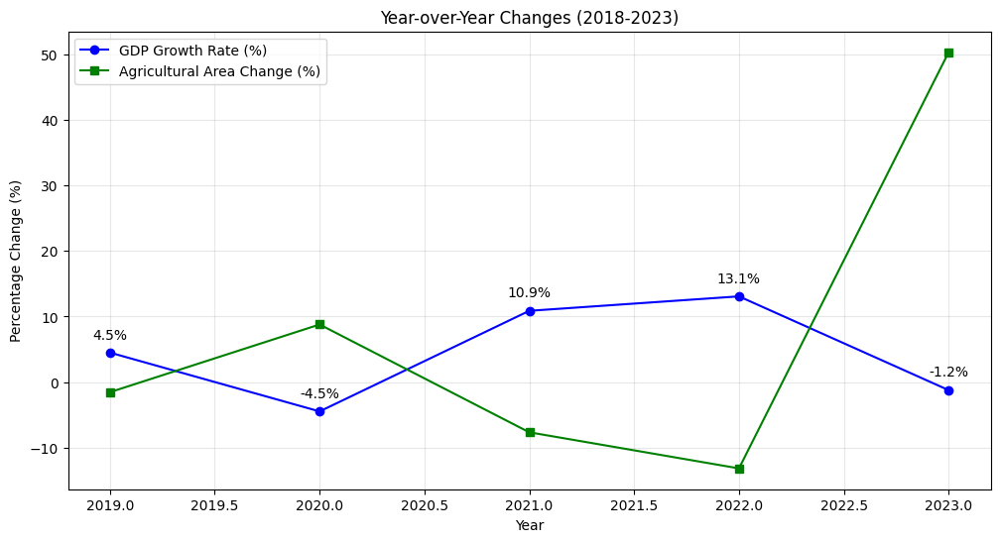


Summary Statistics:

GDP Summary:
              Year  GDP_Billion_EUR  GDP_Growth
count     6.000000         6.000000    5.000000
mean   2020.500000       137.533333    4.555779
std       1.870829        14.153539    7.540049
min    2018.000000       124.100000   -4.464973
25%    2019.250000       125.700000   -1.221080
50%    2020.500000       133.750000    4.505229
75%    2021.750000       149.675000   10.878324
max    2023.000000       155.600000   13.081395

Crop Data Summary:
              Year  Agricultural_Area  Area_Change
count     6.000000           6.000000     5.000000
mean   2020.500000         174.628333     7.353331
std       1.870829          24.365490    25.358979
min    2018.000000         145.290000   -13.156007
25%    2019.250000         166.715000    -7.650696
50%    2020.500000         168.205000    -1.531548
75%    2021.750000         178.147500     8.791737
max    2023.000000         218.390000    50.313167


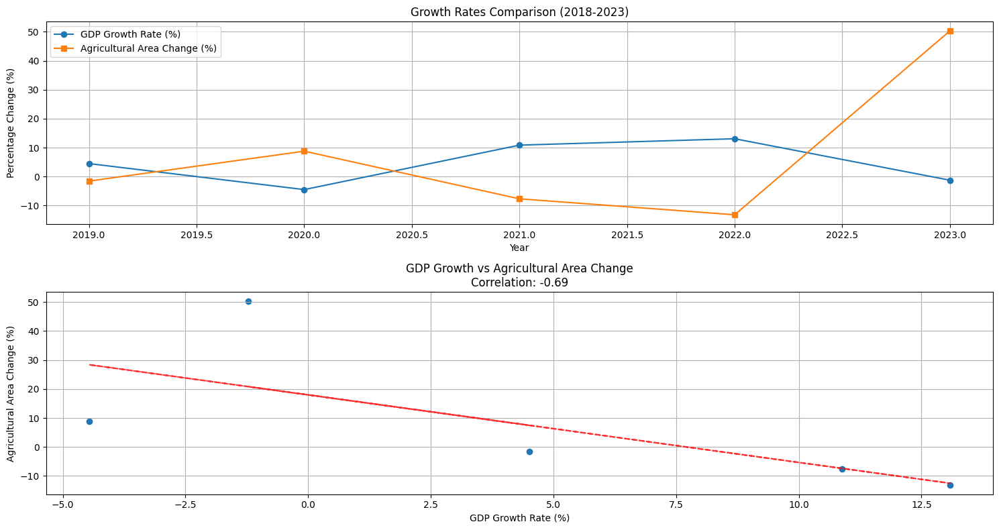

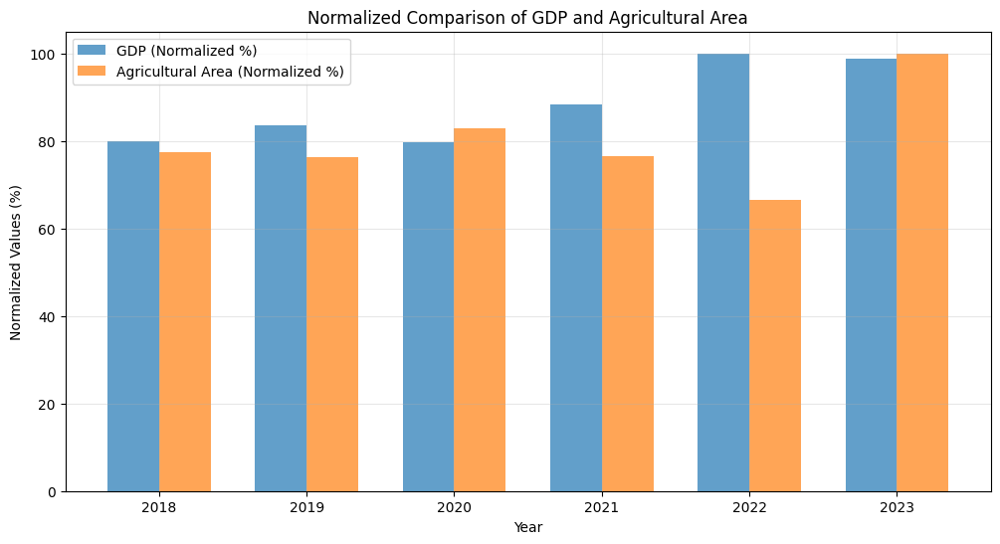

<Figure size 1200x600 with 0 Axes>

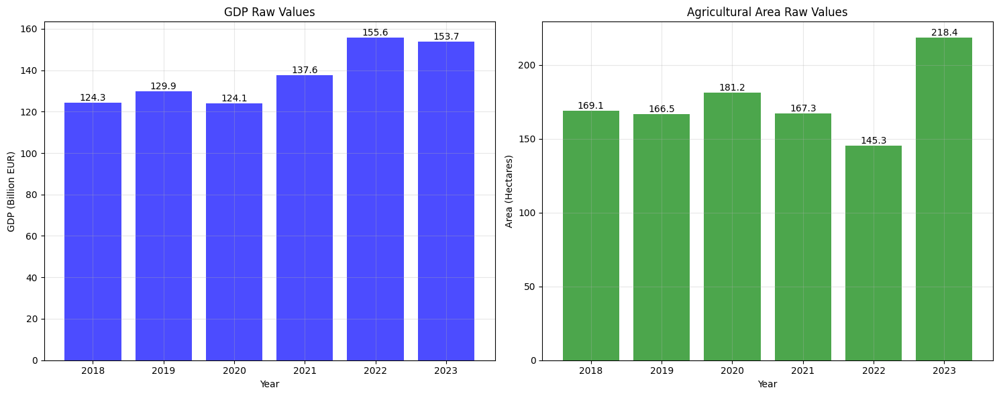

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample data for Hamburg (2015-2020)
# Note: Using sample data since actual CEIC data requires subscription
years = [2018, 2019, 2020, 2021, 2022, 2023]

hamburg_gdp = {
    'Year': years,
    'GDP_Billion_EUR': [124.3, 129.9, 124.1, 137.6, 155.6, 153.7]
}

# Read agricultural data from text file
try:
    with open('green_analysis/green_areas_hectares.txt', 'r') as file:
        # Read all lines and convert to float values
        area_values = [float(line.strip()) for line in file.readlines()]

    # Create crop data dictionary matching years with area values
    crop_data = {
        'Year': years,  # years is already defined as [2018, 2019, 2020, 2021, 2022, 2023]
        'Agricultural_Area': area_values
    }

    if len(area_values) != len(years):
        raise ValueError(f"Number of values in text file ({len(area_values)}) does not match number of years ({len(years)})")

except FileNotFoundError:
    print("Error: Cannot find green_areas_hectares.txt file in green_analysis folder")
    exit()
except ValueError as ve:
    print(f"Error: {ve}")
    exit()
except Exception as e:
    print(f"Error reading text file: {e}")
    exit()

# Create DataFrames
gdp_df = pd.DataFrame(hamburg_gdp)
crop_df = pd.DataFrame(crop_data)

# Calculate year-over-year growth rates
gdp_df['GDP_Growth'] = gdp_df['GDP_Billion_EUR'].pct_change() * 100
crop_df['Area_Change'] = crop_df['Agricultural_Area'].pct_change() * 100

# Print the actual values and their changes to verify
print("\nGDP Values and Growth Rates:")
print(pd.DataFrame({
    'Year': gdp_df['Year'],
    'GDP': gdp_df['GDP_Billion_EUR'],
    'Growth Rate (%)': gdp_df['GDP_Growth']
}))

print("\nAgricultural Area Values and Change Rates:")
print(pd.DataFrame({
    'Year': crop_df['Year'],
    'Area': crop_df['Agricultural_Area'],
    'Change Rate (%)': crop_df['Area_Change']
}))

# Create visualization with clearer labeling
plt.figure(figsize=(12, 6))
plt.plot(gdp_df['Year'][1:], gdp_df['GDP_Growth'][1:], marker='o', label='GDP Growth Rate (%)', color='blue')
plt.plot(crop_df['Year'][1:], crop_df['Area_Change'][1:], marker='s', label='Agricultural Area Change (%)', color='green')

for i, txt in enumerate(gdp_df['GDP_Growth'][1:]):
    plt.annotate(f'{txt:.1f}%',
                (gdp_df['Year'][1:].iloc[i], txt),
                textcoords="offset points",
                xytext=(0,10),
                ha='center')

plt.title('Year-over-Year Changes (2018-2023)')
plt.xlabel('Year')
plt.ylabel('Percentage Change (%)')
plt.grid(True, alpha=0.3)
plt.legend()

# Calculate correlation coefficients (remove production_gdp correlation)
correlation_area_gdp = np.corrcoef(gdp_df['GDP_Growth'][1:], crop_df['Area_Change'][1:])[0,1]

print("\nAnalysis Results:")
print(f"Correlation between GDP growth and Agricultural Area change: {correlation_area_gdp:.2f}")

plt.show()

# Display summary statistics
print("\nSummary Statistics:")
print("\nGDP Summary:")
print(gdp_df.describe())
print("\nCrop Data Summary:")
print(crop_df.describe())

# Create multiple subplots for better visualization
plt.figure(figsize=(15, 8))  # Adjusted size for two plots instead of three

# Plot 1: Original comparison plot
plt.subplot(2, 1, 1)
plt.plot(gdp_df['Year'][1:], gdp_df['GDP_Growth'][1:], marker='o', label='GDP Growth Rate (%)')
plt.plot(crop_df['Year'][1:], crop_df['Area_Change'][1:], marker='s', label='Agricultural Area Change (%)')
plt.title('Growth Rates Comparison (2018-2023)')
plt.xlabel('Year')
plt.ylabel('Percentage Change (%)')
plt.grid(True)
plt.legend()

# Plot 2: Scatter plot with regression line
plt.subplot(2, 1, 2)
x = gdp_df['GDP_Growth'][1:]
y = crop_df['Area_Change'][1:]
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.scatter(x, y)
plt.plot(x, p(x), "r--", alpha=0.8)
plt.title(f'GDP Growth vs Agricultural Area Change\nCorrelation: {correlation_area_gdp:.2f}')
plt.xlabel('GDP Growth Rate (%)')
plt.ylabel('Agricultural Area Change (%)')
plt.grid(True)

plt.tight_layout()
plt.show()

# Add a bar chart comparing absolute values
plt.figure(figsize=(12, 6))
x = np.arange(len(years))
width = 0.35

plt.bar(x - width/2, gdp_df['GDP_Billion_EUR']/gdp_df['GDP_Billion_EUR'].max()*100,
        width, label='GDP (Normalized %)', alpha=0.7)
plt.bar(x + width/2, crop_df['Agricultural_Area']/crop_df['Agricultural_Area'].max()*100,
        width, label='Agricultural Area (Normalized %)', alpha=0.7)

plt.xlabel('Year')
plt.ylabel('Normalized Values (%)')
plt.title('Normalized Comparison of GDP and Agricultural Area')
plt.xticks(x, years)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Add a bar chart showing raw values
plt.figure(figsize=(12, 6))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# GDP raw values
ax1.bar(years, gdp_df['GDP_Billion_EUR'], color='blue', alpha=0.7)
ax1.set_title('GDP Raw Values')
ax1.set_xlabel('Year')
ax1.set_ylabel('GDP (Billion EUR)')
ax1.grid(True, alpha=0.3)
for i, v in enumerate(gdp_df['GDP_Billion_EUR']):
    ax1.text(years[i], v, f'{v:.1f}', ha='center', va='bottom')

# Agricultural Area raw values
ax2.bar(years, crop_df['Agricultural_Area'], color='green', alpha=0.7)
ax2.set_title('Agricultural Area Raw Values')
ax2.set_xlabel('Year')
ax2.set_ylabel('Area (Hectares)')
ax2.grid(True, alpha=0.3)
for i, v in enumerate(crop_df['Agricultural_Area']):
    ax2.text(years[i], v, f'{v:.1f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()